## Mod 2 Final Project: Predicting the Price of a Diamond.

data dictionary:
* price price in US dollars (\$326--\$18,823)
* carat weight of the diamond (0.2--5.01)
* cut quality of the cut (Fair, Good, Very Good, Premium, Ideal)
* color diamond colour, from J (worst) to D (best)
* clarity a measurement of how clear the diamond is (I1 (worst), SI2, SI1, VS2, VS1, VVS2, VVS1, IF (best))
* x length in mm (0--10.74)
* y width in mm (0--58.9)
* z depth in mm (0--31.8)
* depth total depth percentage = z / mean(x, y) = 2 * z / (x + y) (43--79)
* table width of top of diamond relative to widest point (43--95)




In [1]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.formula.api import ols
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.dummy import DummyRegressor
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
pd.set_option('display.max_columns', None)

In [2]:
# read in data
df = pd.read_csv('./diamonds.csv', index_col=0)
df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [3]:
df.describe()

,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [4]:
df.isna().sum()

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
x          0
y          0
z          0
dtype: int64

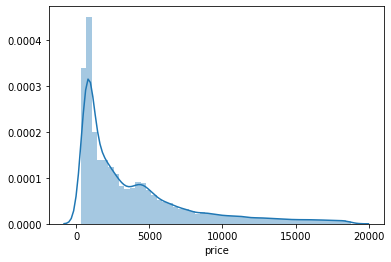

In [5]:
sns.distplot(df.price);

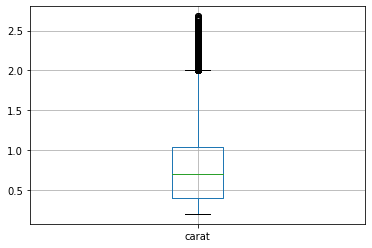

In [31]:
df.boxplot(['carat']);

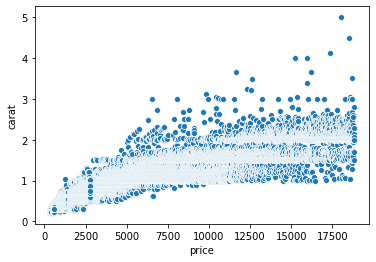

In [7]:
sns.scatterplot(df.price, df.carat)
plt.show();

In [8]:
df.shape

(53940, 10)

(53887, 10)

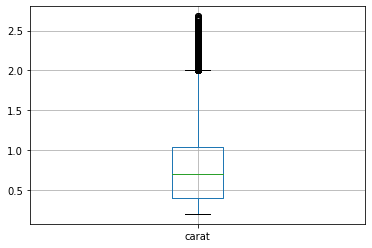

In [9]:
# remove diamonds with carat 4 standard deviations away from mean

carat_mean = df.carat.mean()
carat_std = df.carat.std()

df = df[(df.carat < (carat_mean + (4 * carat_std))) & (df.carat > (carat_mean - (4 * carat_std)))]
df.boxplot(['carat']);

df.shape

In [10]:
# ANOVA test to tell diff in price based on different categories
# price v. color category



In [11]:
# generate polynomial features
df_cont = df[['carat', 'depth',	'table', 'x', 'y', 'z']]
target = df.price

poly = PolynomialFeatures(degree=2, include_bias=False)
poly_data = poly.fit_transform(df_cont)
poly_columns = poly.get_feature_names(df_cont.columns)
df_poly = pd.DataFrame(poly_data, columns=poly_columns)
df_poly.head()

,carat,depth,table,x,y,z,carat^2,carat depth,carat table,carat x,carat y,carat z,depth^2,depth table,depth x,depth y,depth z,table^2,table x,table y,table z,x^2,x y,x z,y^2,y z,z^2
0,0.23,61.5,55.0,3.95,3.98,2.43,0.0529,14.145,12.65,0.9085,0.9154,0.5589,3782.25,3382.5,242.925,244.770,149.445,3025.0,217.25,218.90,133.65,15.6025,15.7210,9.5985,15.8404,9.6714,5.9049
1,0.21,59.8,61.0,3.89,3.84,2.31,0.0441,12.558,12.81,0.8169,0.8064,0.4851,3576.04,3647.8,232.622,229.632,138.138,3721.0,237.29,234.24,140.91,15.1321,14.9376,8.9859,14.7456,8.8704,5.3361
2,0.23,56.9,65.0,4.05,4.07,2.31,0.0529,13.087,14.95,0.9315,0.9361,0.5313,3237.61,3698.5,230.445,231.583,131.439,4225.0,263.25,264.55,150.15,16.4025,16.4835,9.3555,16.5649,9.4017,5.3361
3,0.29,62.4,58.0,4.20,4.23,2.63,0.0841,18.096,16.82,1.2180,1.2267,0.7627,3893.76,3619.2,262.080,263.952,164.112,3364.0,243.60,245.34,152.54,17.6400,17.7660,11.0460,17.8929,11.1249,6.9169
4,0.31,63.3,58.0,4.34,4.35,2.75,0.0961,19.623,17.98,1.3454,1.3485,0.8525,4006.89,3671.4,274.722,275.355,174.075,3364.0,251.72,252.30,159.50,18.8356,18.8790,11.9350,18.9225,11.9625,7.5625


In [12]:

X_train, X_test, y_train, y_test = train_test_split(df_cont, target, random_state=34,test_size=0.2)

dummy_regr = DummyRegressor(strategy="mean")
dummy_regr.fit(X_train, y_train)

dummy_train_preds = dummy_regr.predict(X_train)
dummy_test_preds = dummy_regr.predict(X_test)


In [13]:
#your code here 
scaler = StandardScaler()

# fit the scaler to the training data
scaler.fit(X_train)

#transform the training data
X_train = pd.DataFrame(data=scaler.transform(X_train), columns=df_cont.columns)

#transform the testing data
X_test = pd.DataFrame(data=scaler.transform(X_test), columns=df_cont.columns)

In [14]:
baseline = np.sqrt(metrics.mean_squared_error(y_test, dummy_test_preds))

In [15]:
df.price.mean(), baseline

(3922.368901590365, 3989.820102954273)

In [16]:
lm = LinearRegression()
lm = lm.fit(X_train, y_train)

y_train_pred = lm.predict(X_train) # predictions multiplied by actual value
train_rmse = np.sqrt(metrics.mean_squared_error(y_train, y_train_pred))
print('Training Root Mean Squared Error:' , train_rmse)

y_pred = lm.predict(X_test)
test_rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
print('Testing Root Mean Squared Error:' , test_rmse)

Training Root Mean Squared Error: 1452.589917565248
Testing Root Mean Squared Error: 1454.9427398770472


In [17]:
lm.coef_

array([ 5479.20532265,  -307.83104784,  -231.09897368, -1853.44096422,
          30.72545922,    20.83476193])

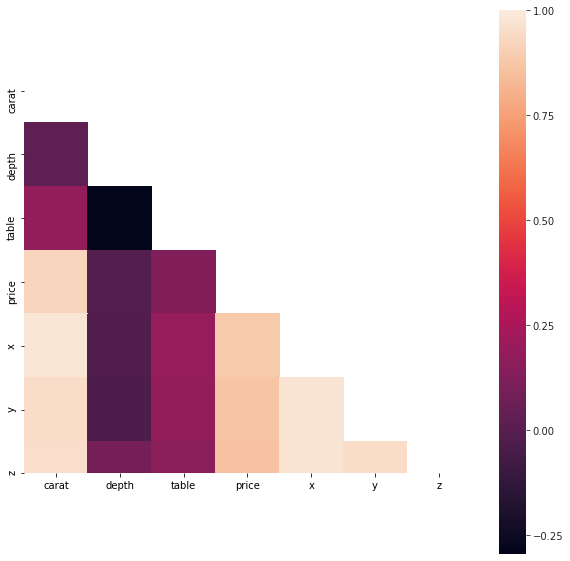

In [18]:
# check for multicolinearity

df.corr()

f, ax = plt.subplots(figsize=(10, 10))
mask = np.zeros_like(df.corr())
mask[np.triu_indices_from(mask)] = True

with sns.axes_style('white'):
    ax = sns.heatmap(df.corr(), mask= mask, square=True)


In [19]:
mlr_model = ols(formula='price~carat+table+depth+x+y+z', data=df).fit()
mlr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.866
Model:                            OLS   Adj. R-squared:                  0.866
Method:                 Least Squares   F-statistic:                 5.825e+04
Date:                Thu, 30 Jul 2020   Prob (F-statistic):               0.00
Time:                        19:02:07   Log-Likelihood:            -4.6884e+05
No. Observations:               53887   AIC:                         9.377e+05
Df Residuals:                   53880   BIC:                         9.377e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2.303e+04    437.131     52.684      0.000    2.22e+04    2.39e+04
carat       1.169e+04     63.969    182.696      0.000    1.16e+04    1.18e+04
table       -103.8047      2.996    -34.649      0.000    -109.677     -97.933
depth       -214.6052      5.368    -39.980      0.000    -225.126    -204.084
x          -1675.2276     42.451    -39.462      0.000   -1758.432   -1592.023
y             43.7373     24.786      1.765      0.078      -4.843      92.317
z             43.6874     43.621      1.002      0.317     -41.809     129.184
==============================================================================
Omnibus:                    16064.338   Durbin-Watson:                   1.280
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           196527.360
Skew:                           1.086   Prob(JB):                         0.00
Kurtosis:                      12.100   Cond. No.                     5.94e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.94e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [20]:
# remove x y z data for bc they are colinear
df.drop(columns=['x', 'y', 'z'], inplace=True)

In [21]:
# create dummy variables
            
df = pd.get_dummies(df, columns=['cut', 'clarity', 'color'])

In [22]:
df.head()

,carat,depth,table,price,cut_Fair,cut_Good,cut_Ideal,cut_Premium,cut_Very Good,clarity_I1,clarity_IF,clarity_SI1,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2,color_D,color_E,color_F,color_G,color_H,color_I,color_J
1,0.23,61.5,55.0,326,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0
2,0.21,59.8,61.0,326,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
3,0.23,56.9,65.0,327,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
4,0.29,62.4,58.0,334,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
5,0.31,63.3,58.0,335,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1


In [28]:
X_train, X_test, y_train, y_test = train_test_split(df_poly, target, random_state=34,test_size=0.2)

lm = LinearRegression()
lm = lm.fit(X_train, y_train)

y_train_pred = lm.predict(X_train) # predictions multiplied by actual value
train_rmse = np.sqrt(metrics.mean_squared_error(y_train, y_train_pred))
print('Training Root Mean Squared Error:' , train_rmse)

y_pred = lm.predict(X_test)
test_rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
print('Testing Root Mean Squared Error:' , test_rmse)

Training Root Mean Squared Error: 1386.0558094156422
Testing Root Mean Squared Error: 1935.3005119898032


model is overfit


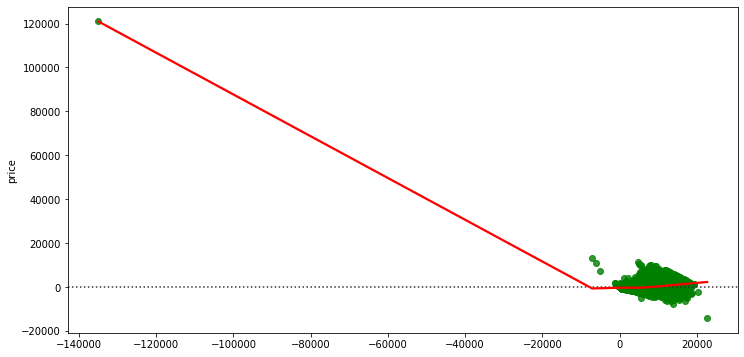

In [34]:
plt.figure(figsize=(12,6))
sns.residplot(y_pred, y_test, lowess=True, color="g", line_kws={"color": "red"});

print('model is overfit')

In [24]:
    
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
X = df.drop(['price'], axis=1)  #independent columns
y = target  #target column i.e price range

# use f-score feature_selection f_regression
bestfeatures = SelectKBest(score_func=f_regression, k=10)
fit = bestfeatures.fit(X,y)

dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns

In [25]:
print(featureScores.nlargest(15,'Score'))  #print 15 best features


Specs          Score
0          carat  313062.636366
11   clarity_SI2     876.163036
2          table     872.482672
17       color_E     550.912411
5      cut_Ideal     502.723390
21       color_I     495.598172
6    cut_Premium     495.440214
14  clarity_VVS1     490.035554
22       color_J     342.324716
16       color_D     281.369726
20       color_H     188.995238
15  clarity_VVS2     144.650401
9     clarity_IF     131.304090
18       color_F      28.805673
3       cut_Fair      13.164617


In [26]:
# create model with selected features

feature_selected_df =  df[['color_J',
    'clarity_SI2',
    'clarity_IF',
    'color_I',
    'color_D',
    'clarity_VVS2',
    'clarity_VS2',
    'color_H',
    'clarity_SI1',
    'clarity_VVS1',
    'clarity_VS1',
    'color_F',
    'color_E',
    'color_G',
    'carat']]

X_train, X_test, y_train, y_test = train_test_split(feature_selected_df, target, random_state=34,test_size=0.2)

lm = LinearRegression()
lm = lm.fit(X_train, y_train)

y_train_pred = lm.predict(X_train) # predictions multiplied by actual value
train_rmse = np.sqrt(metrics.mean_squared_error(y_train, y_train_pred))
print('Training Root Mean Squared Error:' , train_rmse)

y_pred = lm.predict(X_test)
test_rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
print('Testing Root Mean Squared Error:' , test_rmse)


Training Root Mean Squared Error: 1145.6011338817127
Testing Root Mean Squared Error: 1143.0533608583735


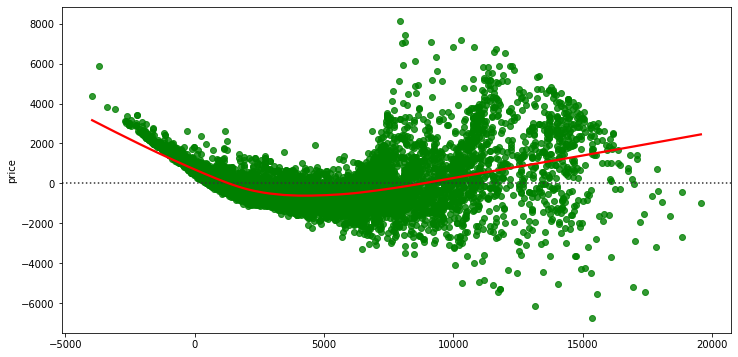

In [27]:
# since k best feature selection has lowest rmse

plt.figure(figsize=(12,6))
sns.residplot(y_pred, y_test, lowess=True, color="g", line_kws={"color": "red"});